# Artificial Intelligence Nanodegree


## Convolutional Neural Networks



## Project: Write an Algorithm for a Dog Identification App 

---

In this notebook, some template code has already been provided for you, and you will need to implement additional functionality to successfully complete this project. You will not need to modify the included code beyond what is requested. Sections that begin with **'(IMPLEMENTATION)'** in the header indicate that the following block of code will require additional functionality which you must provide. Instructions will be provided for each section, and the specifics of the implementation are marked in the code block with a 'TODO' statement. Please be sure to read the instructions carefully! 

> **Note**: Once you have completed all of the code implementations, you need to finalize your work by exporting the iPython Notebook as an HTML document. Before exporting the notebook to html, all of the code cells need to have been run so that reviewers can see the final implementation and output. You can then export the notebook by using the menu above and navigating to  \n",
    "**File -> Download as -> HTML (.html)**. Include the finished document along with this notebook as your submission.

In addition to implementing code, there will be questions that you must answer which relate to the project and your implementation. Each section where you will answer a question is preceded by a **'Question X'** header. Carefully read each question and provide thorough answers in the following text boxes that begin with **'Answer:'**. Your project submission will be evaluated based on your answers to each of the questions and the implementation you provide.

>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut.  Markdown cells can be edited by double-clicking the cell to enter edit mode.

The rubric contains _optional_ "Stand Out Suggestions" for enhancing the project beyond the minimum requirements. If you decide to pursue the "Stand Out Suggestions", you should include the code in this IPython notebook.





---
### Why We're Here 

In this notebook, you will make the first steps towards developing an algorithm that could be used as part of a mobile or web app.  At the end of this project, your code will accept any user-supplied image as input.  If a dog is detected in the image, it will provide an estimate of the dog's breed.  If a human is detected, it will provide an estimate of the dog breed that is most resembling.  The image below displays potential sample output of your finished project (... but we expect that each student's algorithm will behave differently!). 

![Sample Dog Output](images/sample_dog_output.png)

In this real-world setting, you will need to piece together a series of models to perform different tasks; for instance, the algorithm that detects humans in an image will be different from the CNN that infers dog breed.  There are many points of possible failure, and no perfect algorithm exists.  Your imperfect solution will nonetheless create a fun user experience!

### The Road Ahead

We break the notebook into separate steps.  Feel free to use the links below to navigate the notebook.

* [Step 0](#step0): Import Datasets
* [Step 1](#step1): Detect Humans
* [Step 2](#step2): Detect Dogs
* [Step 3](#step3): Create a CNN to Classify Dog Breeds (from Scratch)
* [Step 4](#step4): Use a CNN to Classify Dog Breeds (using Transfer Learning)
* [Step 5](#step5): Create a CNN to Classify Dog Breeds (using Transfer Learning)
* [Step 6](#step6): Write your Algorithm
* [Step 7](#step7): Test Your Algorithm


In [1]:
from utils import (
    Dog,
    Human,
    Face,
    Nature,
    Animal
)

2023-05-28 22:49:44.335716: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.



---
<a id='step0'></a>
## Step 0: Import Datasets

### Import Dog Dataset

In the code cell below, we import a dataset of dog images.  We populate a few variables through the use of the `load_files` function from the scikit-learn library:
- `train_files`, `valid_files`, `test_files` - numpy arrays containing file paths to images
- `train_targets`, `valid_targets`, `test_targets` - numpy arrays containing onehot-encoded classification labels 
- `dog_names` - list of string-valued dog breed names for translating labels

In [2]:
%%time
dog_files_dict, dog_labels_dict, dog_names = Dog.datasets()

There are 133 total dog categories.
There are 8351 total dog images.

There are 6680 training files and 6680 training labels.
There are 835 validation files and 835 validation labels.
There are 836 test files and 836 test labels.
CPU times: user 295 ms, sys: 949 ms, total: 1.24 s
Wall time: 3.36 s


### Import Human Dataset

In the code cell below, we import a dataset of human images, where the file paths are stored in the numpy array `human_files`.

In [3]:
%%time
human_files_dict, human_labels_dict = Human.datasets()

There are 5749 total human categories.
There are 13233 total human images.

There are 10586 training files and 10586 training labels.
There are 1323 validation files and 1323 validation labels.
There are 1324 test files and 1324 test labels.
CPU times: user 583 ms, sys: 990 ms, total: 1.57 s
Wall time: 3.34 s


---
<a id='step1'></a>
## Step 1: Detect Humans

We use OpenCV's implementation of [Haar feature-based cascade classifiers](http://docs.opencv.org/trunk/d7/d8b/tutorial_py_face_detection.html) to detect human faces in images.  OpenCV provides many pre-trained face detectors, stored as XML files on [github](https://github.com/opencv/opencv/tree/master/data/haarcascades).  We have downloaded one of these detectors and stored it in the `haarcascades` directory.

In the next code cell, we demonstrate how to use this detector to find human faces in a sample image.

datasets/lfw/Alberto_Fujimori/Alberto_Fujimori_0002.jpg


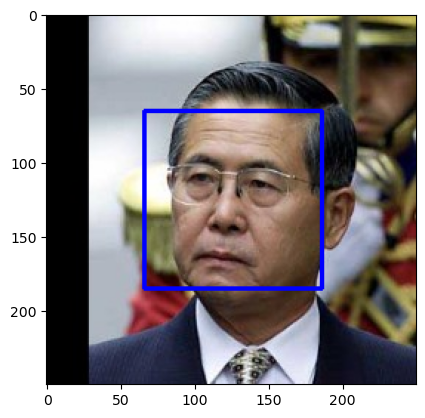

In [4]:
human_img_path = human_files_dict["test"][921]
print(human_img_path)
Human.test_faces_detector(human_img_path)

Before using any of the face detectors, it is standard procedure to convert the images to grayscale.  The `detectMultiScale` function executes the classifier stored in `face_cascade` and takes the grayscale image as a parameter.  

In the above code, `faces` is a numpy array of detected faces, where each row corresponds to a detected face.  Each detected face is a 1D array with four entries that specifies the bounding box of the detected face.  The first two entries in the array (extracted in the above code as `x` and `y`) specify the horizontal and vertical positions of the top left corner of the bounding box.  The last two entries in the array (extracted here as `w` and `h`) specify the width and height of the box.

### Write a Human Face Detector

We can use this procedure to write a function that returns `True` if a human face is detected in an image and `False` otherwise.  This function, aptly named `face_detector`, takes a string-valued file path to an image as input and appears in the code block below.

In [5]:
# returns "True" if face is detected in image stored at img_path
Human.face_detector(human_img_path)

(True, (250, 250, 3))

### (IMPLEMENTATION) Assess the Human Face Detector

__Question 1:__ Use the code cell below to test the performance of the `face_detector` function.  
- What percentage of the first 100 images in `human_files` have a detected human face?  
- What percentage of the first 100 images in `dog_files` have a detected human face? 

Ideally, we would like 100% of human images with a detected face and 0% of dog images with a detected face.  You will see that our algorithm falls short of this goal, but still gives acceptable performance.  We extract the file paths for the first 100 images from each of the datasets and store them in the numpy arrays `human_files_short` and `dog_files_short`.

__Answer:__ 98% of the first 100 images in human_files have a detected human face and 0 % of 100 images in dog_files have a human face

In [6]:
%%time
Human.test2_faces_detector(human_files_dict["test"], dog_files_dict["test"],no_samples=100)

no human detected at index 62 which corresponds to file = datasets/lfw/Mariah_Carey/Mariah_Carey_0003.jpg
detected human in dog image at index 1 which corresponds to file = datasets/dogImages/test/059.Doberman_pinscher/Doberman_pinscher_04156.jpg
detected human in dog image at index 2 which corresponds to file = datasets/dogImages/test/115.Papillon/Papillon_07480.jpg
detected human in dog image at index 24 which corresponds to file = datasets/dogImages/test/036.Briard/Briard_02519.jpg
detected human in dog image at index 30 which corresponds to file = datasets/dogImages/test/005.Alaskan_malamute/Alaskan_malamute_00330.jpg
detected human in dog image at index 46 which corresponds to file = datasets/dogImages/test/101.Maltese/Maltese_06728.jpg
detected human in dog image at index 60 which corresponds to file = datasets/dogImages/test/011.Australian_cattle_dog/Australian_cattle_dog_00761.jpg
detected human in dog image at index 64 which corresponds to file = datasets/dogImages/test/100.Lo

__Question 2:__ This algorithmic choice necessitates that we communicate to the user that we accept human images only when they provide a clear view of a face (otherwise, we risk having unneccessarily frustrated users!). In your opinion, is this a reasonable expectation to pose on the user? If not, can you think of a way to detect humans in images that does not necessitate an image with a clearly presented face?

__Answer:__ I tried a CNN, but without success.

We suggest the face detector from OpenCV as a potential way to detect human images in your algorithm, but you are free to explore other approaches, especially approaches that make use of deep learning :).  Please use the code cell below to design and test your own face detection algorithm.  If you decide to pursue this _optional_ task, report performance on each of the datasets.

In [7]:
Human.datasets()[0]

There are 5749 total human categories.
There are 13233 total human images.

There are 10586 training files and 10586 training labels.
There are 1323 validation files and 1323 validation labels.
There are 1324 test files and 1324 test labels.


{'train': array(['datasets/lfw/Gabriel_Hughes/Gabriel_Hughes_0001.jpg',
        'datasets/lfw/George_Clooney/George_Clooney_0001.jpg',
        'datasets/lfw/Paul-Henri_Mathieu/Paul-Henri_Mathieu_0001.jpg', ...,
        'datasets/lfw/James_Traficant/James_Traficant_0001.jpg',
        'datasets/lfw/Justin_Timberlake/Justin_Timberlake_0001.jpg',
        'datasets/lfw/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0020.jpg'],
       dtype='<U93'),
 'valid': array(['datasets/lfw/Adrian_McPherson/Adrian_McPherson_0001.jpg',
        'datasets/lfw/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0022.jpg',
        'datasets/lfw/Victor_Hanescu/Victor_Hanescu_0001.jpg', ...,
        'datasets/lfw/Juan_Carlos/Juan_Carlos_0001.jpg',
        'datasets/lfw/Lindsay_Davenport/Lindsay_Davenport_0012.jpg',
        'datasets/lfw/Normand_Legault/Normand_Legault_0001.jpg'],
       dtype='<U93'),
 'test': array(['datasets/lfw/Pringe_Ernst_August/Pringe_Ernst_August_0001.jpg',
        'datasets/lfw/L

In [8]:
Nature.datasets()[0]

{'train': array([[[[255, 255, 255],
          [255, 255, 255],
          [255, 255, 255],
          ...,
          [195, 205, 193],
          [212, 224, 204],
          [182, 194, 167]],
 
         [[255, 255, 255],
          [254, 254, 254],
          [254, 254, 254],
          ...,
          [170, 176, 150],
          [161, 168, 130],
          [146, 154, 113]],
 
         [[255, 255, 255],
          [254, 254, 254],
          [255, 255, 255],
          ...,
          [189, 199, 169],
          [166, 178, 130],
          [121, 133,  87]],
 
         ...,
 
         [[148, 185,  79],
          [142, 182,  57],
          [140, 179,  60],
          ...,
          [ 30,  17,   1],
          [ 65,  62,  15],
          [ 76,  77,  20]],
 
         [[122, 157,  66],
          [120, 155,  58],
          [126, 160,  71],
          ...,
          [ 22,  16,   3],
          [ 97, 112,  56],
          [141, 161,  87]],
 
         [[ 87, 122,  41],
          [ 88, 122,  39],
          [101, 134, 

In [9]:
from utils import Animal

In [10]:
human_files_dict = Human.datasets()[0]
nature_files_dict = Nature.datasets()[0]
animal_files_dict = Animal.datasets()[0]
dog_files_dict = Dog.datasets()[0]

There are 5749 total human categories.
There are 13233 total human images.

There are 10586 training files and 10586 training labels.
There are 1323 validation files and 1323 validation labels.
There are 1324 test files and 1324 test labels.
There are 50 total animal ategories.
There are 37322 total animal images.

There are 29857 training files and 29857 training labels.
There are 3732 validation files and 3732 validation labels.
There are 3733 test files and 3733 test labels.
There are 133 total dog categories.
There are 8351 total dog images.

There are 6680 training files and 6680 training labels.
There are 835 validation files and 835 validation labels.
There are 836 test files and 836 test labels.


In [11]:
data,labels = Face.labelled_data()

Read image paths...
There are 133 total dog categories.
There are 8351 total dog images.

There are 6680 training files and 6680 training labels.
There are 835 validation files and 835 validation labels.
There are 836 test files and 836 test labels.
Number of 'no face' images = 105673
Number of 'face' images = 13233
done.
Processing files with open cv...


Premature end of JPEG file


done.
Making labels...
done.
         2768705 function calls (2768702 primitive calls) in 385.574 seconds

   Ordered by: cumulative time

   ncalls  tottime  percall  cumtime  percall filename:lineno(function)
        1    0.298    0.298  333.821  333.821 utils.py:392(<listcomp>)
    58906  333.522    0.006  333.522    0.006 {imread}
        1    0.170    0.170   51.740   51.740 utils.py:370(image_paths)
        5    0.001    0.000   28.318    5.664 utils.py:27(load_dataset)
        5    0.383    0.077   28.287    5.657 _base.py:101(load_files)
    58906    0.175    0.000   26.777    0.000 pathlib.py:1255(read_bytes)
    61486   24.602    0.000   24.602    0.000 {method 'read' of '_io.BufferedReader' objects}
        1    1.396    1.396   24.355   24.355 utils.py:88(whole_dataset)
        1    0.007    0.007   21.688   21.688 utils.py:36(whole_dataset)
       12   21.200    1.767   21.200    1.767 {method 'tolist' of 'numpy.ndarray' objects}
        1    0.018    0.018    2.793    2.7

In [12]:
%%time
X_train, X_val, X_test, y_train, y_val, y_test = Face.datasets()

Read image paths...
There are 133 total dog categories.
There are 8351 total dog images.

There are 6680 training files and 6680 training labels.
There are 835 validation files and 835 validation labels.
There are 836 test files and 836 test labels.
Number of 'no face' images = 105673
Number of 'face' images = 13233
done.
Processing files with open cv...


: 

: 

In [1]:
faces_model = Face.model()

NameError: name 'Face' is not defined

In [ ]:
%%time
from keras.callbacks import ModelCheckpoint, EarlyStopping

checkpointer = ModelCheckpoint(
    filepath="saved_models/bestweights_facesmodel.hdf5", verbose=1, save_best_only=True
)

earlyStop = EarlyStopping(patience=3)

epochs = 3

faces_model.fit(
    X_train,
    y_train,
    validation_data=(X_valid, y_valid),
    epochs=epochs,
    batch_size=20,
    callbacks=[checkpointer, earlyStop],
    verbose=1,
)

Train on 1658 samples, validate on 208 samples
Epoch 1/3
1658/1658 [==============================] - 265s 160ms/step - loss: 7.2500 - acc: 0.5452 - val_loss: 15.9424 - val_acc: 0.0000e+00

Epoch 00001: val_loss improved from inf to 15.94238, saving model to saved_models/bestweights_facesmodel.hdf5
Epoch 2/3
1658/1658 [==============================] - 265s 160ms/step - loss: 7.2500 - acc: 0.5452 - val_loss: 15.9424 - val_acc: 0.0000e+00

Epoch 00002: val_loss did not improve
Epoch 3/3
1658/1658 [==============================] - 265s 160ms/step - loss: 7.2500 - acc: 0.5452 - val_loss: 15.9424 - val_acc: 0.0000e+00

Epoch 00003: val_loss did not improve
CPU times: user 35min 6s, sys: 4min 37s, total: 39min 44s
Wall time: 13min 15s


In [ ]:
# returns "True" if face is detected in image stored at img_path
def face_detector2(img_path, model):
    img = cv2.imread(img_path, cv2.IMREAD_COLOR)
    interpol = cv2.INTER_LINEAR
    if img.shape[0] < 250 and img.shape[1] < 250:
        interpol = cv2.INTER_CUBIC
    elif img.shape[0] > 250 and img.shape[1] > 250:
        interpol = cv2.INTER_AREA
    else:
        pass
    resized_img = cv2.resize(img, (x_pixels, y_pixels), interpolation=interpol)
    faces = model.predict(np.expand_dims(resized_img, axis=0))
    return len(faces) > 0

In [ ]:
%%time
# human_files_short = human_files[:100]
# dog_files_short = train_files[:100]
human_files_short = human_files[0:1000]
dog_files_short = train_files[0:1000]
# Do NOT modify the code above this line.

## TODO: Test the performance of the face_detector algorithm
## on the images in human_files_short and dog_files_short.
h_in_h_count = 0
h_in_d_count = 0

CPU times: user 16 µs, sys: 2 µs, total: 18 µs
Wall time: 21.9 µs


In [ ]:
%%time
from keras.models import load_model

model = load_model("saved_models/bestweights_facesmodel.hdf5")
for human_files_2 in human_files_short:
    if face_detector2(human_files_2, model):
        h_in_h_count += 1
    else:
        print(
            "no human detected at index i = ",
            np.where(human_files == human_files_short)[0][0],
        )

for dog_files_2 in dog_files_short:
    if face_detector2(dog_files_2, model):
        h_in_d_count += 1

hcount_to_percentage = 100 / len(human_files_short)
dcount_to_percentage = 100 / len(dog_files_short)
print(
    "percentage of detected humans in human images = ",
    "{:>2}".format(h_in_h_count * hcount_to_percentage),
    "%",
)
print(
    "percentage of detected humans in dog images = ",
    "{:>2}".format(h_in_d_count * dcount_to_percentage),
    "%",
)

percentage of detected humans in human images =  100.0 %
percentage of detected humans in dog images =  100.0 %
CPU times: user 5min 10s, sys: 18.7 s, total: 5min 29s
Wall time: 1min 49s


---
<a id='step2'></a>
## Step 2: Detect Dogs

In this section, we use a pre-trained [ResNet-50](http://ethereon.github.io/netscope/#/gist/db945b393d40bfa26006) model to detect dogs in images.  Our first line of code downloads the ResNet-50 model, along with weights that have been trained on [ImageNet](http://www.image-net.org/), a very large, very popular dataset used for image classification and other vision tasks.  ImageNet contains over 10 million URLs, each linking to an image containing an object from one of [1000 categories](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a).  Given an image, this pre-trained ResNet-50 model returns a prediction (derived from the available categories in ImageNet) for the object that is contained in the image.

In [ ]:
from keras.applications.resnet50 import ResNet50

# define ResNet50 model
ResNet50_model = ResNet50(weights="imagenet")

### Pre-process the Data

When using TensorFlow as backend, Keras CNNs require a 4D array (which we'll also refer to as a 4D tensor) as input, with shape

$$
(\text{nb_samples}, \text{rows}, \text{columns}, \text{channels}),
$$

where `nb_samples` corresponds to the total number of images (or samples), and `rows`, `columns`, and `channels` correspond to the number of rows, columns, and channels for each image, respectively.  

The `path_to_tensor` function below takes a string-valued file path to a color image as input and returns a 4D tensor suitable for supplying to a Keras CNN.  The function first loads the image and resizes it to a square image that is $224 \times 224$ pixels.  Next, the image is converted to an array, which is then resized to a 4D tensor.  In this case, since we are working with color images, each image has three channels.  Likewise, since we are processing a single image (or sample), the returned tensor will always have shape

$$
(1, 224, 224, 3).
$$

The `paths_to_tensor` function takes a numpy array of string-valued image paths as input and returns a 4D tensor with shape 

$$
(\text{nb_samples}, 224, 224, 3).
$$

Here, `nb_samples` is the number of samples, or number of images, in the supplied array of image paths.  It is best to think of `nb_samples` as the number of 3D tensors (where each 3D tensor corresponds to a different image) in your dataset!

In [ ]:
from keras.preprocessing import image
from tqdm import tqdm


def path_to_tensor(img_path):
    # loads RGB image as PIL.Image.Image type
    img = image.load_img(img_path, target_size=(224, 224))
    # convert PIL.Image.Image type to 3D tensor with shape (224, 224, 3)
    x = image.img_to_array(img)
    # convert 3D tensor to 4D tensor with shape (1, 224, 224, 3) and return 4D tensor
    return np.expand_dims(x, axis=0)


def paths_to_tensor(img_paths):
    list_of_tensors = [path_to_tensor(img_path) for img_path in tqdm(img_paths)]
    return np.vstack(list_of_tensors)

### Making Predictions with ResNet-50

Getting the 4D tensor ready for ResNet-50, and for any other pre-trained model in Keras, requires some additional processing.  First, the RGB image is converted to BGR by reordering the channels.  All pre-trained models have the additional normalization step that the mean pixel (expressed in RGB as $[103.939, 116.779, 123.68]$ and calculated from all pixels in all images in ImageNet) must be subtracted from every pixel in each image.  This is implemented in the imported function `preprocess_input`.  If you're curious, you can check the code for `preprocess_input` [here](https://github.com/fchollet/keras/blob/master/keras/applications/imagenet_utils.py).

Now that we have a way to format our image for supplying to ResNet-50, we are now ready to use the model to extract the predictions.  This is accomplished with the `predict` method, which returns an array whose $i$-th entry is the model's predicted probability that the image belongs to the $i$-th ImageNet category.  This is implemented in the `ResNet50_predict_labels` function below.

By taking the argmax of the predicted probability vector, we obtain an integer corresponding to the model's predicted object class, which we can identify with an object category through the use of this [dictionary](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a). 

In [ ]:
from keras.applications.resnet50 import preprocess_input, decode_predictions


def ResNet50_predict_labels(img_path):
    # returns prediction vector for image located at img_path
    img = preprocess_input(path_to_tensor(img_path))
    return np.argmax(ResNet50_model.predict(img))

### Write a Dog Detector

While looking at the [dictionary](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a), you will notice that the categories corresponding to dogs appear in an uninterrupted sequence and correspond to dictionary keys 151-268, inclusive, to include all categories from `'Chihuahua'` to `'Mexican hairless'`.  Thus, in order to check to see if an image is predicted to contain a dog by the pre-trained ResNet-50 model, we need only check if the `ResNet50_predict_labels` function above returns a value between 151 and 268 (inclusive).

We use these ideas to complete the `dog_detector` function below, which returns `True` if a dog is detected in an image (and `False` if not).

In [ ]:
### returns "True" if a dog is detected in the image stored at img_path
def dog_detector(img_path):
    prediction = ResNet50_predict_labels(img_path)
    return (prediction <= 268) & (prediction >= 151)

### (IMPLEMENTATION) Assess the Dog Detector

__Question 3:__ Use the code cell below to test the performance of your `dog_detector` function.  
- What percentage of the images in `human_files_short` have a detected dog?  
- What percentage of the images in `dog_files_short` have a detected dog?

__Answer:__ For the first 1000 images, nearly 100% of dogs are recognized in dog images and below 1% of humans are classified as dogs by the dog detector.

In [ ]:
%%time
### TODO: Test the performance of the dog_detector function
### on the images in human_files_short and dog_files_short.
d_in_h_percentage = 0
d_in_d_percentage = 0

for human_files in human_files_short:
    if dog_detector(human_files):
        d_in_h_percentage += 100 / len(human_files_short)

for dog_files in dog_files_short:
    if dog_detector(dog_files):
        d_in_d_percentage += 100 / len(dog_files_short)
    else:
        print(
            "no dog detected at index i = ",
            np.where(dog_files == dog_files_short)[0][0],
        )

print(
    "percentage of detected dogs in human images = ",
    "{:>2}".format(d_in_h_percentage),
    "%",
)
print(
    "percentage of detected dogs in dog images = ",
    "{:>2}".format(d_in_d_percentage),
    "%",
)

no dog detected at index i =  146
no dog detected at index i =  162
no dog detected at index i =  242
no dog detected at index i =  313
no dog detected at index i =  322
no dog detected at index i =  400
no dog detected at index i =  480
no dog detected at index i =  529
no dog detected at index i =  530
no dog detected at index i =  578
no dog detected at index i =  654
no dog detected at index i =  690
no dog detected at index i =  755
no dog detected at index i =  808
no dog detected at index i =  965
no dog detected at index i =  991
percentage of detected dogs in human images =  0.8999999999999999 %
percentage of detected dogs in dog images =  98.39999999999868 %
CPU times: user 35min 12s, sys: 2min 24s, total: 37min 36s
Wall time: 12min 32s


---
<a id='step3'></a>
## Step 3: Create a CNN to Classify Dog Breeds (from Scratch)

Now that we have functions for detecting humans and dogs in images, we need a way to predict breed from images.  In this step, you will create a CNN that classifies dog breeds.  You must create your CNN _from scratch_ (so, you can't use transfer learning _yet_!), and you must attain a test accuracy of at least 1%.  In Step 5 of this notebook, you will have the opportunity to use transfer learning to create a CNN that attains greatly improved accuracy.

Be careful with adding too many trainable layers!  More parameters means longer training, which means you are more likely to need a GPU to accelerate the training process.  Thankfully, Keras provides a handy estimate of the time that each epoch is likely to take; you can extrapolate this estimate to figure out how long it will take for your algorithm to train. 

We mention that the task of assigning breed to dogs from images is considered exceptionally challenging.  To see why, consider that *even a human* would have great difficulty in distinguishing between a Brittany and a Welsh Springer Spaniel.  

Brittany | Welsh Springer Spaniel
- | - 
<img src="images/Brittany_02625.jpg" width="100"> | <img src="images/Welsh_springer_spaniel_08203.jpg" width="200">

It is not difficult to find other dog breed pairs with minimal inter-class variation (for instance, Curly-Coated Retrievers and American Water Spaniels).  

Curly-Coated Retriever | American Water Spaniel
- | -
<img src="images/Curly-coated_retriever_03896.jpg" width="200"> | <img src="images/American_water_spaniel_00648.jpg" width="200">


Likewise, recall that labradors come in yellow, chocolate, and black.  Your vision-based algorithm will have to conquer this high intra-class variation to determine how to classify all of these different shades as the same breed.  

Yellow Labrador | Chocolate Labrador | Black Labrador
- | -
<img src="images/Labrador_retriever_06457.jpg" width="150"> | <img src="images/Labrador_retriever_06455.jpg" width="240"> | <img src="images/Labrador_retriever_06449.jpg" width="220">

We also mention that random chance presents an exceptionally low bar: setting aside the fact that the classes are slightly imabalanced, a random guess will provide a correct answer roughly 1 in 133 times, which corresponds to an accuracy of less than 1%.  

Remember that the practice is far ahead of the theory in deep learning.  Experiment with many different architectures, and trust your intuition.  And, of course, have fun! 

### Pre-process the Data

We rescale the images by dividing every pixel in every image by 255.

In [ ]:
from PIL import ImageFile

ImageFile.LOAD_TRUNCATED_IMAGES = True

# pre-process the data for Keras
train_tensors = paths_to_tensor(train_files).astype("float32") / 255
valid_tensors = paths_to_tensor(valid_files).astype("float32") / 255
test_tensors = paths_to_tensor(test_files).astype("float32") / 255

100%|██████████| 836/836 [00:07<00:00, 106.30it/s]


### (IMPLEMENTATION) Model Architecture

Create a CNN to classify dog breed.  At the end of your code cell block, summarize the layers of your model by executing the line:
    
        model.summary()

We have imported some Python modules to get you started, but feel free to import as many modules as you need.  If you end up getting stuck, here's a hint that specifies a model that trains relatively fast on CPU and attains >1% test accuracy in 5 epochs:

![Sample CNN](images/sample_cnn.png)
           
__Question 4:__ Outline the steps you took to get to your final CNN architecture and your reasoning at each step.  If you chose to use the hinted architecture above, describe why you think that CNN architecture should work well for the image classification task.

__Answer:__ The main ideas were: The convolutional layers should identify patterns in an image and higher layers should learn more difficult features, therefore I increased the number of filters by 2 for each higher layer. Max pooling was used after each layer to generate some invariance to data. Relu activations were used to enable the network to learn non-linear relationships and the dropout layers were introduced to avoid overfitting, as we work on a small dataset here. In order to do classification, a fully-connected layer was added at the top of the network.

In [ ]:
from keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D
from keras.layers import Dropout, Flatten, Dense, BatchNormalization
from keras.layers import Activation
from keras.models import Sequential


def conv2d(
    mdl,
    filters=16,
    kernel_size=(3, 3),
    strides=(1, 1),
    padding="same",
    input_shape=None,
):
    if input_shape == None:
        mdl.add(
            Conv2D(
                filters=filters,
                kernel_size=kernel_size,
                strides=strides,
                padding=padding,
            )
        )
    else:
        mdl.add(
            Conv2D(
                filters=filters,
                kernel_size=kernel_size,
                strides=strides,
                padding=padding,
                input_shape=input_shape,
            )
        )


def maxpool2d(mdl, pool_size=(2, 2), strides=(2, 2)):
    mdl.add(MaxPooling2D(pool_size, strides))


def activation(mdl, activation="relu"):
    mdl.add(Activation(activation))


def gap2d(mdl, data_format="channels_last"):
    mdl.add(GlobalAveragingPooling2D(data_format))


def flatten(mdl):
    mdl.add(Flatten())


def dense(mdl, filters):
    mdl.add(Dense(filters))


def dropout(mdl, drop_prob=0.0):  # 0.1 better than 0.2
    mdl.add(Dropout(drop_prob))


def batchnormalize(mdl):
    mdl.add(BatchNormalization())


model = Sequential()

### TODO: Define your architecture.
conv2d(model, input_shape=(224, 224, 3))
dropout(model)
batchnormalize(model)
activation(model)
maxpool2d(model)
conv2d(model, filters=32)
dropout(model)
batchnormalize(model)
activation(model)
maxpool2d(model)
conv2d(model, filters=64)
dropout(model)
batchnormalize(model)
activation(model)
maxpool2d(model)
flatten(model)
dense(model, filters=133)
batchnormalize(model)
activation(model, "softmax")

model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 224, 224, 16)      448       
_________________________________________________________________
dropout_1 (Dropout)          (None, 224, 224, 16)      0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 224, 224, 16)      64        
_________________________________________________________________
activation_50 (Activation)   (None, 224, 224, 16)      0         
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 112, 112, 16)      0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 112, 112, 32)      4640      
_________________________________________________________________
dropout_2 (Dropout)          (None, 112, 112, 32)      0         
__________

### Compile the Model

In [ ]:
model.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])

### (IMPLEMENTATION) Train the Model

Train your model in the code cell below.  Use model checkpointing to save the model that attains the best validation loss.

You are welcome to [augment the training data](https://blog.keras.io/building-powerful-image-classification-models-using-very-little-data.html), but this is not a requirement. 

In [ ]:
%%time
from keras.callbacks import ModelCheckpoint

### TODO: specify the number of epochs that you would like to use to train the model.

epochs = 10

### Do NOT modify the code below this line.

checkpointer = ModelCheckpoint(
    filepath="saved_models/weights.best.from_scratch.hdf5",
    verbose=1,
    save_best_only=True,
)

model.fit(
    train_tensors,
    train_targets,
    validation_data=(valid_tensors, valid_targets),
    epochs=epochs,
    batch_size=20,
    callbacks=[checkpointer],
    verbose=1,
)

Train on 6680 samples, validate on 835 samples
Epoch 1/10
6680/6680 [==============================] - 926s 139ms/step - loss: 4.5595 - acc: 0.0476 - val_loss: 4.6957 - val_acc: 0.0575

Epoch 00001: val_loss improved from inf to 4.69568, saving model to saved_models/weights.best.from_scratch.hdf5
Epoch 2/10
6680/6680 [==============================] - 917s 137ms/step - loss: 3.5781 - acc: 0.2454 - val_loss: 4.4015 - val_acc: 0.0599

Epoch 00002: val_loss improved from 4.69568 to 4.40151, saving model to saved_models/weights.best.from_scratch.hdf5
Epoch 3/10
6680/6680 [==============================] - 907s 136ms/step - loss: 2.2870 - acc: 0.7726 - val_loss: 4.8284 - val_acc: 0.0515

Epoch 00003: val_loss did not improve
Epoch 4/10
6680/6680 [==============================] - 925s 138ms/step - loss: 1.4751 - acc: 0.9510 - val_loss: 5.0705 - val_acc: 0.0371

Epoch 00004: val_loss did not improve
Epoch 5/10
6680/6680 [==============================] - 861s 129ms/step - loss: 1.0984 - acc:

KeyboardInterrupt: 

### Load the Model with the Best Validation Loss

In [ ]:
model.load_weights("saved_models/weights.best.from_scratch.hdf5")

### Test the Model

Try out your model on the test dataset of dog images.  Ensure that your test accuracy is greater than 1%.

In [ ]:
# get index of predicted dog breed for each image in test set
dog_breed_predictions = [
    np.argmax(model.predict(np.expand_dims(tensor, axis=0))) for tensor in test_tensors
]

# report test accuracy
test_accuracy = (
    100
    * np.sum(np.array(dog_breed_predictions) == np.argmax(test_targets, axis=1))
    / len(dog_breed_predictions)
)
print("Test accuracy: %.4f%%" % test_accuracy)

Test accuracy: 7.5359%


---
<a id='step4'></a>
## Step 4: Use a CNN to Classify Dog Breeds

To reduce training time without sacrificing accuracy, we show you how to train a CNN using transfer learning.  In the following step, you will get a chance to use transfer learning to train your own CNN.

### Obtain Bottleneck Features

In [ ]:
bottleneck_features = np.load("bottleneck_features/DogVGG16Data.npz")
train_VGG16 = bottleneck_features["train"]
valid_VGG16 = bottleneck_features["valid"]
test_VGG16 = bottleneck_features["test"]

### Model Architecture

The model uses the the pre-trained VGG-16 model as a fixed feature extractor, where the last convolutional output of VGG-16 is fed as input to our model.  We only add a global average pooling layer and a fully connected layer, where the latter contains one node for each dog category and is equipped with a softmax.

In [ ]:
VGG16_model = Sequential()
VGG16_model.add(GlobalAveragePooling2D(input_shape=train_VGG16.shape[1:]))
VGG16_model.add(Dense(133, activation="softmax"))

VGG16_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
global_average_pooling2d_1 ( (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 133)               68229     
Total params: 68,229
Trainable params: 68,229
Non-trainable params: 0
_________________________________________________________________


### Compile the Model

In [ ]:
VGG16_model.compile(
    loss="categorical_crossentropy", optimizer="rmsprop", metrics=["accuracy"]
)

### Train the Model

In [ ]:
%%time
checkpointer = ModelCheckpoint(
    filepath="saved_models/weights.best.VGG16.hdf5", verbose=1, save_best_only=True
)

VGG16_model.fit(
    train_VGG16,
    train_targets,
    validation_data=(valid_VGG16, valid_targets),
    epochs=20,
    batch_size=20,
    callbacks=[checkpointer],
    verbose=1,
)

Train on 6680 samples, validate on 835 samples
Epoch 1/20
6680/6680 [==============================] - 8s 1ms/step - loss: 11.8218 - acc: 0.1392 - val_loss: 10.4092 - val_acc: 0.2108

Epoch 00001: val_loss improved from inf to 10.40916, saving model to saved_models/weights.best.VGG16.hdf5
Epoch 2/20
6680/6680 [==============================] - 2s 315us/step - loss: 9.6934 - acc: 0.3013 - val_loss: 9.5498 - val_acc: 0.3198

Epoch 00002: val_loss improved from 10.40916 to 9.54977, saving model to saved_models/weights.best.VGG16.hdf5
Epoch 3/20
6680/6680 [==============================] - 2s 275us/step - loss: 9.1917 - acc: 0.3635 - val_loss: 9.2417 - val_acc: 0.3389

Epoch 00003: val_loss improved from 9.54977 to 9.24166, saving model to saved_models/weights.best.VGG16.hdf5
Epoch 4/20
6680/6680 [==============================] - 3s 453us/step - loss: 8.8641 - acc: 0.3984 - val_loss: 9.0968 - val_acc: 0.3509

Epoch 00004: val_loss improved from 9.24166 to 9.09680, saving model to saved_mo

### Load the Model with the Best Validation Loss

In [ ]:
VGG16_model.load_weights("saved_models/weights.best.VGG16.hdf5")

### Test the Model

Now, we can use the CNN to test how well it identifies breed within our test dataset of dog images.  We print the test accuracy below.

In [ ]:
# get index of predicted dog breed for each image in test set
VGG16_predictions = [
    np.argmax(VGG16_model.predict(np.expand_dims(feature, axis=0)))
    for feature in test_VGG16
]

# report test accuracy
test_accuracy = (
    100
    * np.sum(np.array(VGG16_predictions) == np.argmax(test_targets, axis=1))
    / len(VGG16_predictions)
)
print("Test accuracy: %.4f%%" % test_accuracy)

Test accuracy: 49.0431%


### Predict Dog Breed with the Model

In [ ]:
from extract_bottleneck_features import *


def VGG16_predict_breed(img_path):
    # extract bottleneck features
    bottleneck_feature = extract_VGG16(path_to_tensor(img_path))
    # obtain predicted vector
    predicted_vector = VGG16_model.predict(bottleneck_feature)
    # return dog breed that is predicted by the model
    return dog_names[np.argmax(predicted_vector)]

---
<a id='step5'></a>
## Step 5: Create a CNN to Classify Dog Breeds (using Transfer Learning)

You will now use transfer learning to create a CNN that can identify dog breed from images.  Your CNN must attain at least 60% accuracy on the test set.

In Step 4, we used transfer learning to create a CNN using VGG-16 bottleneck features.  In this section, you must use the bottleneck features from a different pre-trained model.  To make things easier for you, we have pre-computed the features for all of the networks that are currently available in Keras:
- [VGG-19](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/DogVGG19Data.npz) bottleneck features
- [ResNet-50](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/DogResnet50Data.npz) bottleneck features
- [Inception](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/DogInceptionV3Data.npz) bottleneck features
- [Xception](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/DogXceptionData.npz) bottleneck features

The files are encoded as such:

    Dog{network}Data.npz
    
where `{network}`, in the above filename, can be one of `VGG19`, `Resnet50`, `InceptionV3`, or `Xception`.  Pick one of the above architectures, download the corresponding bottleneck features, and store the downloaded file in the `bottleneck_features/` folder in the repository.

### (IMPLEMENTATION) Obtain Bottleneck Features

In the code block below, extract the bottleneck features corresponding to the train, test, and validation sets by running the following:

    bottleneck_features = np.load('bottleneck_features/Dog{network}Data.npz')
    train_{network} = bottleneck_features['train']
    valid_{network} = bottleneck_features['valid']
    test_{network} = bottleneck_features['test']

In [ ]:
### TODO: Obtain bottleneck features from another pre-trained CNN.
bottleneck_features = np.load("bottleneck_features/DogXceptionData.npz")
train_Xception = bottleneck_features["train"]
valid_Xception = bottleneck_features["valid"]
test_Xception = bottleneck_features["test"]

### (IMPLEMENTATION) Model Architecture

Create a CNN to classify dog breed.  At the end of your code cell block, summarize the layers of your model by executing the line:
    
        <your model's name>.summary()
   
__Question 5:__ Outline the steps you took to get to your final CNN architecture and your reasoning at each step.  Describe why you think the architecture is suitable for the current problem.

__Answer:__ I did not change any of the convolutional layers, which might have improved accuracy a little. But as the Xception network was trained on a similar dataset, and we operate on a smaller dataset here, I decided to just add a global average pooling layer and a fully connected layer. As the network is very deep and has a 7x7x2048 output for the last convolutional layer and I needed a vectorized form for the dense layer to be adjusted to the problem here, I decided that global average pooling is a good option to do this. And then, as we have 133 different dog breeds to classify, I set this as the number of output nodes for the fully connected layer.

In [ ]:
### TODO: Define your architecture.
Xception_model = Sequential()
Xception_model.add(
    GlobalAveragePooling2D(input_shape=train_Xception.shape[1:], name="gap_xception")
)
Xception_model.add(Dense(133, activation="softmax", name="dense_xception"))
Xception_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gap_xception (GlobalAverageP (None, 2048)              0         
_________________________________________________________________
dense_xception (Dense)       (None, 133)               272517    
Total params: 272,517
Trainable params: 272,517
Non-trainable params: 0
_________________________________________________________________


### (IMPLEMENTATION) Compile the Model

In [ ]:
### TODO: Compile the model.
Xception_model.compile(
    loss="categorical_crossentropy", optimizer="rmsprop", metrics=["accuracy"]
)

### (IMPLEMENTATION) Train the Model

Train your model in the code cell below.  Use model checkpointing to save the model that attains the best validation loss.  

You are welcome to [augment the training data](https://blog.keras.io/building-powerful-image-classification-models-using-very-little-data.html), but this is not a requirement. 

In [ ]:
### TODO: Train the model.
from keras.callbacks import ModelCheckpoint, EarlyStopping

epochs = 50
checkpoint = ModelCheckpoint(
    filepath="saved_models/Xception.best_weights.hdf5", verbose=1, save_best_only=True
)
early_stop = EarlyStopping(patience=3)

In [ ]:
%%time
Xception_model.fit(
    train_Xception,
    train_targets,
    batch_size=32,
    epochs=epochs,
    verbose=2,
    callbacks=[checkpoint, early_stop],
    validation_data=(valid_Xception, valid_targets),
)

Train on 6680 samples, validate on 835 samples
Epoch 1/50
 - 9s - loss: 1.1741 - acc: 0.7195 - val_loss: 0.5229 - val_acc: 0.8287

Epoch 00001: val_loss improved from inf to 0.52287, saving model to saved_models/Xception.best_weights.hdf5
Epoch 2/50
 - 6s - loss: 0.3938 - acc: 0.8747 - val_loss: 0.4800 - val_acc: 0.8515

Epoch 00002: val_loss improved from 0.52287 to 0.48004, saving model to saved_models/Xception.best_weights.hdf5
Epoch 3/50
 - 4s - loss: 0.3053 - acc: 0.9027 - val_loss: 0.4508 - val_acc: 0.8515

Epoch 00003: val_loss improved from 0.48004 to 0.45078, saving model to saved_models/Xception.best_weights.hdf5
Epoch 4/50
 - 3s - loss: 0.2501 - acc: 0.9190 - val_loss: 0.4748 - val_acc: 0.8527

Epoch 00004: val_loss did not improve
Epoch 5/50
 - 3s - loss: 0.2157 - acc: 0.9280 - val_loss: 0.4931 - val_acc: 0.8539

Epoch 00005: val_loss did not improve
Epoch 6/50
 - 3s - loss: 0.1837 - acc: 0.9412 - val_loss: 0.4945 - val_acc: 0.8431

Epoch 00006: val_loss did not improve
CPU

### (IMPLEMENTATION) Load the Model with the Best Validation Loss

In [ ]:
### TODO: Load the model weights with the best validation loss.
Xception_model.load_weights("saved_models/Xception.best_weights.hdf5")

### (IMPLEMENTATION) Test the Model

Try out your model on the test dataset of dog images. Ensure that your test accuracy is greater than 60%.

In [ ]:
### TODO: Calculate classification accuracy on the test dataset.
score = Xception_model.evaluate(test_Xception, test_targets, verbose=0)
print("\n", "Test accuracy:", score[1])


 Test accuracy: 0.8504784689


### (IMPLEMENTATION) Predict Dog Breed with the Model

Write a function that takes an image path as input and returns the dog breed (`Affenpinscher`, `Afghan_hound`, etc) that is predicted by your model.  

Similar to the analogous function in Step 5, your function should have three steps:
1. Extract the bottleneck features corresponding to the chosen CNN model.
2. Supply the bottleneck features as input to the model to return the predicted vector.  Note that the argmax of this prediction vector gives the index of the predicted dog breed.
3. Use the `dog_names` array defined in Step 0 of this notebook to return the corresponding breed.

The functions to extract the bottleneck features can be found in `extract_bottleneck_features.py`, and they have been imported in an earlier code cell.  To obtain the bottleneck features corresponding to your chosen CNN architecture, you need to use the function

    extract_{network}
    
where `{network}`, in the above filename, should be one of `VGG19`, `Resnet50`, `InceptionV3`, or `Xception`.

In [ ]:
### TODO: Write a function that takes a path to an image as input
### and returns the dog breed that is predicted by the model.
def Xception_predictbreed(img_path):
    Xception_bottlenecks = extract_Xception(path_to_tensor(img_path))
    Xception_prediction = Xception_model.predict(Xception_bottlenecks)
    return dog_names[np.argmax(Xception_prediction)]

---
<a id='step6'></a>
## Step 6: Write your Algorithm

Write an algorithm that accepts a file path to an image and first determines whether the image contains a human, dog, or neither.  Then,
- if a __dog__ is detected in the image, return the predicted breed.
- if a __human__ is detected in the image, return the resembling dog breed.
- if __neither__ is detected in the image, provide output that indicates an error.

You are welcome to write your own functions for detecting humans and dogs in images, but feel free to use the `face_detector` and `dog_detector` functions developed above.  You are __required__ to use your CNN from Step 5 to predict dog breed.  

Some sample output for our algorithm is provided below, but feel free to design your own user experience!

![Sample Human Output](images/sample_human_output.png)


### (IMPLEMENTATION) Write your Algorithm

In [ ]:
### TODO: Write your algorithm.
### Feel free to use as many code cells as needed.
from IPython.display import Image, display


def Xception_detector(img_path):
    # display the image
    display(Image(img_path))
    # detect human and be pretty sure about it:)
    if face_detector(img_path) == True and dog_detector(img_path) == False:
        print("You are human, and the dog breed you resemble most is ...")
    # detect dog and be pretty sure about it:)
    elif face_detector(img_path) == False and dog_detector(img_path) == True:
        print("You are a dog with breed ...")
    else:
        print("Well, the dog breed you resemble most is ...")
    print(Xception_predictbreed(img_path))

---
<a id='step7'></a>
## Step 7: Test Your Algorithm

In this section, you will take your new algorithm for a spin!  What kind of dog does the algorithm think that __you__ look like?  If you have a dog, does it predict your dog's breed accurately?  If you have a cat, does it mistakenly think that your cat is a dog?

### (IMPLEMENTATION) Test Your Algorithm on Sample Images!

Test your algorithm at least six images on your computer.  Feel free to use any images you like.  Use at least two human and two dog images.  

__Question 6:__ Is the output better than you expected :) ?  Or worse :( ?  Provide at least three possible points of improvement for your algorithm.

__Answer:__ I think the output is pretty amazing. Still, there are some improvements possible: 1) Fine-tuning of parameters of last convolutional layer (maybe using gridsearch or a genetic algorithm). 2) The detector is not optimal and mixed breeds are not taken into account (the 3rd dog here is differently classified in different runs). 3) Data Augmentation could be used: rotations and zoom of images. Although I am not sure how successful it is to apply opencv's functions on the bottlenecks, but I might try it out later. 

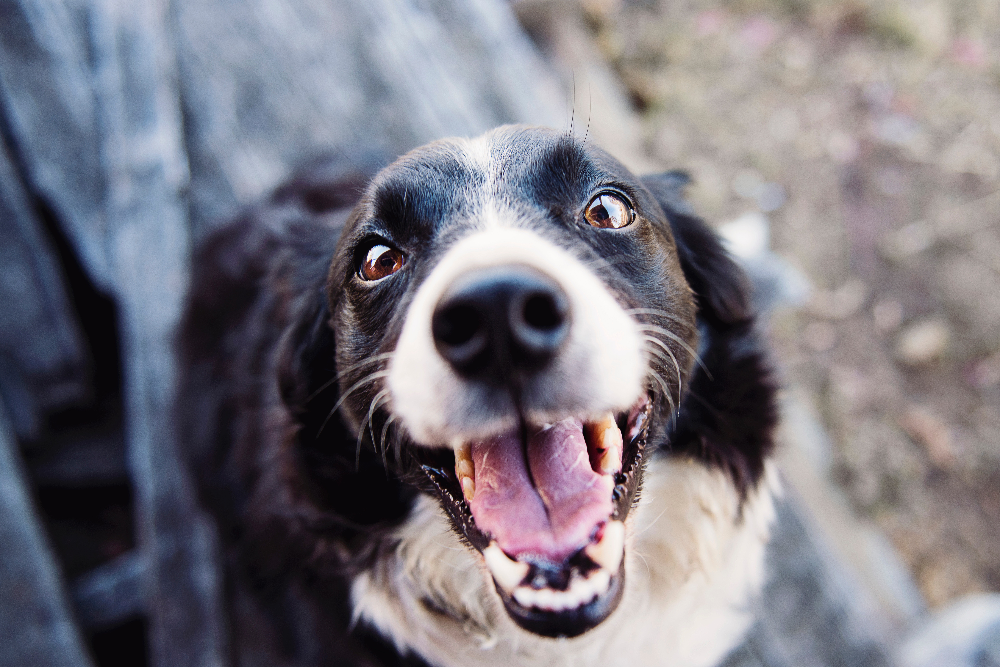

You are a dog with breed ...
Australian_shepherd


In [ ]:
## TODO: Execute your algorithm from Step 6 on
## at least 6 images on your computer.
## Feel free to use as many code cells as needed.
Xception_detector("./testImages/01/animal-blur-canine-551628.jpg")

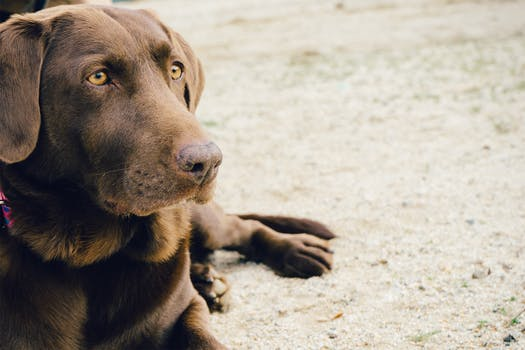

You are a dog with breed ...
Labrador_retriever


In [ ]:
Xception_detector("./testImages/02/animal-dog-pet-brown.jpg")

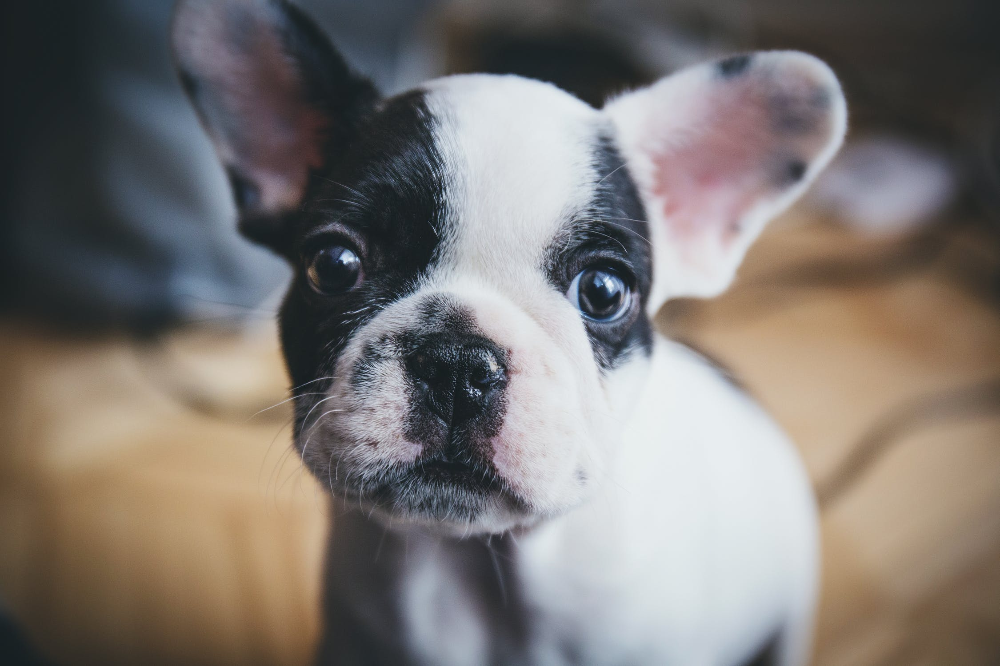

You are a dog with breed ...
French_bulldog


In [ ]:
Xception_detector("./testImages/03/pexels-photo-14644.jpeg")

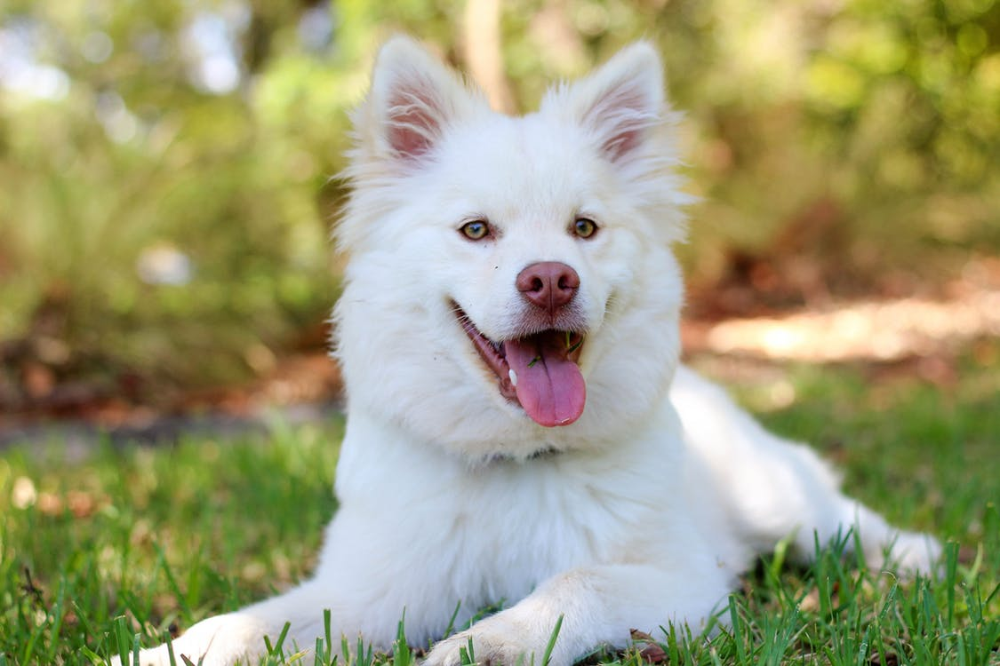

You are a dog with breed ...
American_eskimo_dog


In [ ]:
Xception_detector("./testImages/04/pexels-photo-356378.jpeg")

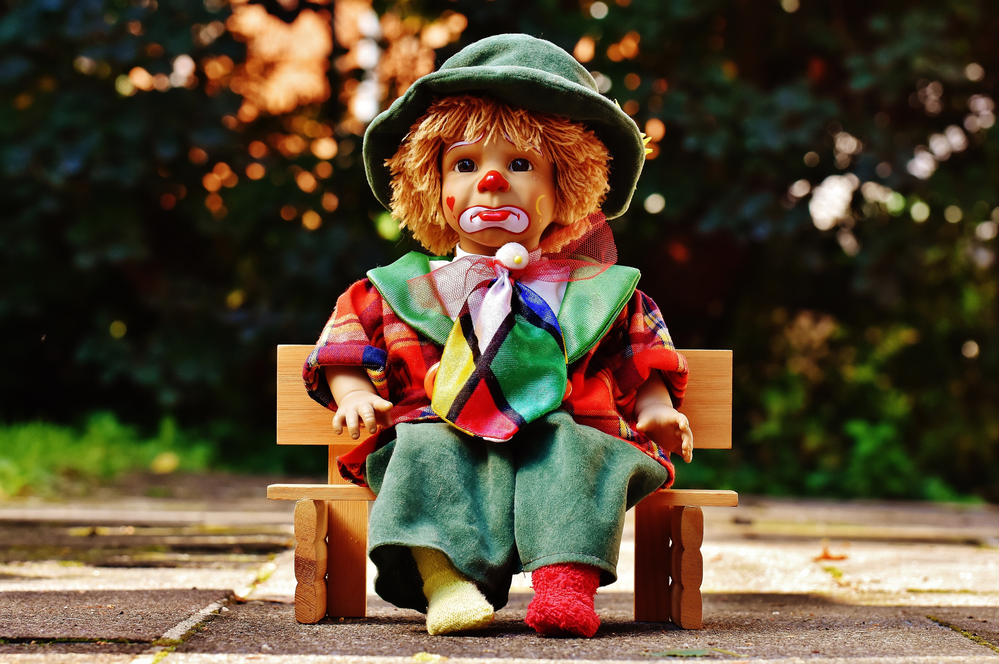

Well, the dog breed you resemble most is ...
Dachshund


In [ ]:
Xception_detector("./testImages/05/clown.jpg")

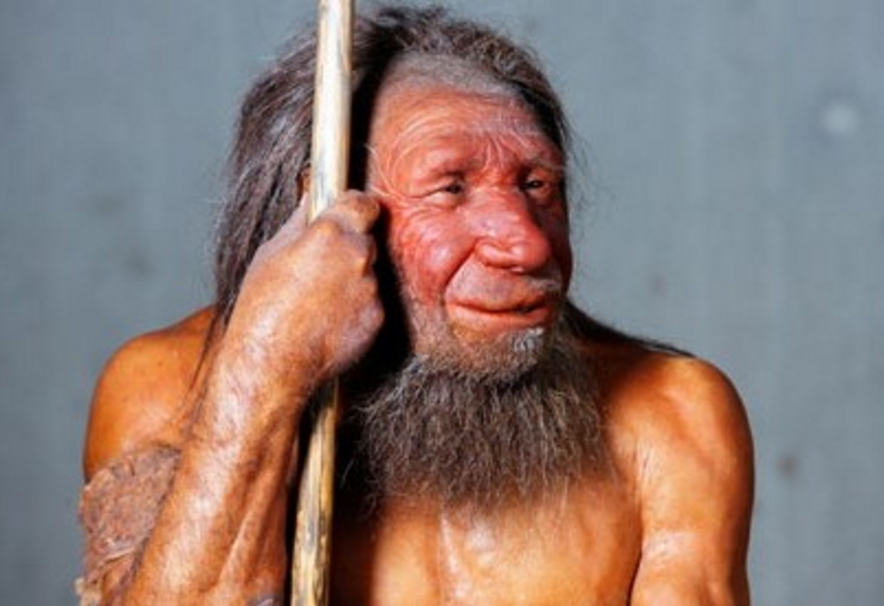

You are human, and the dog breed you resemble most is ...
Bloodhound


In [ ]:
Xception_detector("./testImages/06/neanderthal.png")

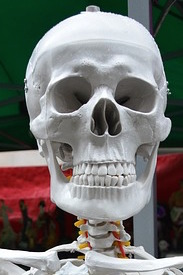

Well, the dog breed you resemble most is ...
Chinese_crested


In [ ]:
Xception_detector("./testImages/07/skeleton2.jpg")

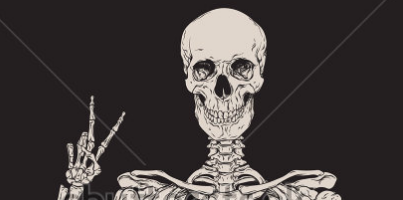

You are human, and the dog breed you resemble most is ...
Chinese_crested


In [ ]:
Xception_detector("./testImages/07/skeleton3.png")